# Introduction

#### Chicago is the most popular city in the U.S. state of Illinois and the third most populous city in the United States. With 77 communities and an estimated population of 2,705,994 (2018), it is also the most populous city in the Midwestern United States. So,there are hundreds and thousands of business opportunities waiting for us to explore.

#### This project aims to give a big picture about where to start your restaurant business, based on the analysis from average community population, average community income and existing restaurant locations aspects.

In [2]:
import warnings
warnings.simplefilter('ignore')

import numpy as np
import pandas as pd

# convert an address into latitude and longitude values
from geopy.geocoders import Nominatim 

# map rendering library
import folium 

# url request
import requests

# import k-means from clustering stage
from sklearn.cluster import KMeans

# Matplotlib and associated plotting modules
import matplotlib.cm as cm 
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

# Load Dataset

In [3]:
# Load Chicago community dataset
df_chi_cmty = pd.read_csv('./data/chicago-community-areas.csv')
df_chi_cmty

,Community Area,1,2,3,4,5,6,7,8,9,...,68,69,70,71,72,73,74,75,76,77
0,name,Rogers Park,West Ridge,Uptown,Lincoln Square,North Center,Lake View,Lincoln Park,Near North Side,Edison Park,...,Englewood,Greater Grand Crossing,Ashburn,Auburn Gresham,Beverly,Washington Heights,Mount Greenwood,Morgan Park,O'Hare,Edgewater
1,population,54991,71942,56362,39493,31867,94368,64116,80484,11187,...,30654,32602,41081,48743,20034,26493,19093,22544,12756,56521
2,income,39482,47323,40324,57749,81524,70746,82707,76290,77678,...,19743,29663,62238,34767,83092,42053,80505,56886,49601,43331
3,requests,3204.8880725907,3906.3412193156,2164.0466981295,3827.2605271849,5307.9988703031,2742.2431332668,3408.6655437027,1717.6084687635,4754.6259050653,...,5459.646375673,6296.85295381,5599.4255251814,5785.446115344,6985.125287016,6641.7544256946,4357.6179751737,6264.1944641542,1552.9946691765,2564.8873869877
4,latinos,0.244,0.204,0.142,0.191,0.136,0.076,0.056,0.049,0.078,...,0.011,0.012,0.368,0.009,0.046,0.01,0.072,0.027,0.095,0.165
5,blacks,0.263,0.111,0.2,0.038,0.023,0.039,0.043,0.108,0.003,...,0.974,0.969,0.462,0.978,0.341,0.974,0.052,0.667,0.032,0.143
6,white,0.393,0.427,0.516,0.631,0.773,0.804,0.829,0.721,0.884,...,0.003,0.006,0.152,0.003,0.588,0.005,0.86,0.287,0.772,0.547
7,asian,0.064,0.225,0.114,0.111,0.045,0.06,0.051,0.101,0.024,...,0.001,0.001,0.007,0.001,0.006,0,0.007,0.004,0.083,0.116
8,other,0.036,0.032,0.028,0.029,0.022,0.021,0.021,0.02,0.012,...,0.011,0.013,0.011,0.009,0.019,0.012,0.01,0.014,0.019,0.029


# Data Preprocessing

### 1. Retrive chicogo community info: name, population, avgerage income

In [4]:
df_chi_info = df_chi_cmty.transpose().loc['1':'77', [0, 1, 2]].reset_index(drop=True)
df_chi_info.columns = ['community', 'population', 'income']

# To verfity the number of the community, which show be 77
print (f'The shape of the commuity data is {df_chi_info.shape}')

df_chi_info.head()

The shape of the commuity data is (77, 3)


,community,population,income
0,Rogers Park,54991,39482
1,West Ridge,71942,47323
2,Uptown,56362,40324
3,Lincoln Square,39493,57749
4,North Center,31867,81524


In [5]:
df_chi_info.nunique()

community     77
population    77
income        77
dtype: int64

### 2. Add latitude and longitude to the data

In [6]:
# Define functions to get latitude and longitude
def getLatitude(location):
    address = location + ', ' + 'Chicago'
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(address)
    latitude = location.latitude
    return latitude

def getLongitude(location):
    address = location + ', ' + 'Chicago'
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(address)
    longitude = location.longitude
    return longitude

In [9]:
# Convet 'population' datatype to int, 'income' to float
df_chi_info['population'] = df_chi_info['population'].map(int)
df_chi_info['income'] = df_chi_info['income'].map(float)

# Use geopy library to get the latitude and longitude values
df_chi_info['latitude'] = df_chi_info['community'].apply(lambda x: getLatitude(x))
df_chi_info['longitude'] = df_chi_info['community'].apply(lambda x: getLongitude(x))
df_chi_info.head()

,community,population,income,latitude,longitude
0,Rogers Park,54991,39482.0,42.010531,-87.670748
1,West Ridge,71942,47323.0,42.003548,-87.696243
2,Uptown,56362,40324.0,41.966630,-87.655546
3,Lincoln Square,39493,57749.0,41.975990,-87.689616
4,North Center,31867,81524.0,41.956107,-87.679160


In [10]:
df_chi_info.nunique()

community     77
population    77
income        77
latitude      77
longitude     77
dtype: int64

### 3. Visualization all the communities in Chicago

In [11]:
# create map of Chicago Communities using latitude and longitude values, Chicago.location = [41.8781, -87.6298] 
map_chicago = folium.Map(location=[41.8781, -87.6298], zoom_start=10)

# add markers to map
for lat, lng, community in zip(df_chi_info['latitude'], df_chi_info['longitude'], df_chi_info['community']):
    label = f'{community}'
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_chicago)
    
map_chicago

# Exploratory Data Analysis

### 1. Define Foursquare Credentials and Version

In [12]:
CLIENT_ID = '3EIW2ITW1J0JRZZANMKZ1AVEIW3QYUPWCRXJMS23ITAWLVRA' # your Foursquare ID
CLIENT_SECRET = 'PEZWGF3OTY12TZKYW4DX5JX5YYLQH0SRLINLY2LPR3SPXDH2' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 3EIW2ITW1J0JRZZANMKZ1AVEIW3QYUPWCRXJMS23ITAWLVRA
CLIENT_SECRET:PEZWGF3OTY12TZKYW4DX5JX5YYLQH0SRLINLY2LPR3SPXDH2


### 2. Find Food Spots around each community

In [13]:
# Create a function to explore the venues of the neighorhood
def getNearbyFoodSpots(names, latitudes, longitudes, radius=2000, LIMIT=100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&intent=food&&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Community', 
                  'Community Latitude', 
                  'Community Longitude', 
                  'FoodSpot', 
                  'FoodSpot Latitude', 
                  'FoodSpot Longitude', 
                  'FoodSpot Category']
    
    return(nearby_venues)

In [14]:
# find FoodSpots for each community and show the process for each neighborhood
chi_FoodSpots = getNearbyFoodSpots(names=df_chi_info['community'],
                                 latitudes=df_chi_info['latitude'],
                                 longitudes=df_chi_info['longitude'])

Rogers Park
West Ridge
Uptown
Lincoln Square
North Center
Lake View
Lincoln Park
Near North Side
Edison Park
Norwood Park
Jefferson Park
Forest Glen
North Park
Albany Park
Portage Park
Irving Park
Dunning
Montclare
Belmont Cragin
Hermosa
Avondale
Logan Square
Humboldt Park
West Town
Austin
West Garfield Park
East Garfield Park
Near West Side
North Lawndale
South Lawndale
Lower West Side
Loop
Near South Side
Armour Square
Douglas
Oakland
Fuller Park
Grand Boulevard
Kenwood
Washington Park
Hyde Park
Woodlawn
South Shore
Chatham
Avalon Park
South Chicago
Burnside
Calumet Heights
Roseland
Pullman
South Deering
East Side
West Pullman
Riverdale
Hegewisch
Garfield Ridge
Archer Heights
Brighton Park
McKinley Park
Bridgeport
New City
West Elsdon
Gage Park
Clearing
West Lawn
Chicago Lawn
West Englewood
Englewood
Greater Grand Crossing
Ashburn
Auburn Gresham
Beverly
Washington Heights
Mount Greenwood
Morgan Park
O'Hare
Edgewater


In [15]:
chi_FoodSpots.head(5)

,Community,Community Latitude,Community Longitude,FoodSpot,FoodSpot Latitude,FoodSpot Longitude,FoodSpot Category
0,Rogers Park,42.010531,-87.670748,El Famous Burrito,42.010421,-87.674204,Mexican Restaurant
1,Rogers Park,42.010531,-87.670748,Taqueria & Restaurant Cd. Hidalgo,42.011634,-87.674484,Mexican Restaurant
2,Rogers Park,42.010531,-87.670748,Smack Dab Bakery,42.004495,-87.673058,Bakery
3,Rogers Park,42.010531,-87.670748,Smack Dab,42.009291,-87.666201,Bakery
4,Rogers Park,42.010531,-87.670748,J.B. Alberto's Pizza,42.007941,-87.665066,Pizza Place


In [16]:
chi_FoodSpots.nunique()

Community                77
Community Latitude       77
Community Longitude      77
FoodSpot               2821
FoodSpot Latitude      3686
FoodSpot Longitude     3685
FoodSpot Category        96
dtype: int64

### 3. Visualize foodspot with barplot and map plot

In [17]:
FoodSpots_count = chi_FoodSpots.groupby(by=['Community'])['FoodSpot'].count().to_frame().sort_values('FoodSpot')
FoodSpots_count.head(10)

,FoodSpot
Community,
Riverdale,5
South Deering,8
Hegewisch,12
West Pullman,17
Pullman,25
South Chicago,29
East Side,29
Forest Glen,34
Roseland,39


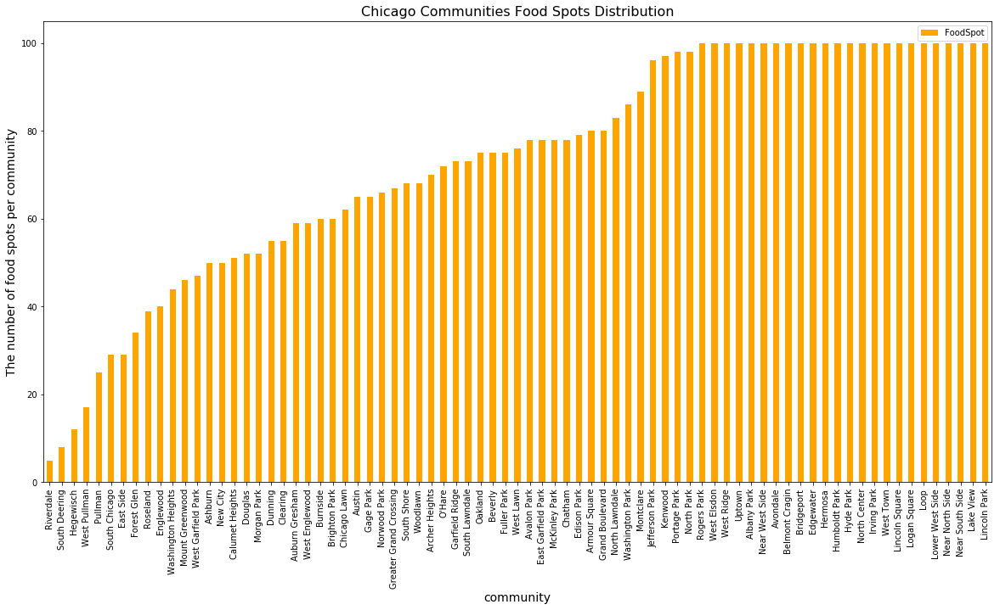

In [18]:
# Visualize food spots distribution with barplot
ax = FoodSpots_count.plot(kind='bar', figsize=(20,10), color='orange')
ax.set_title('Chicago Communities Food Spots Distribution', fontsize=16)
ax.set_ylabel('The number of food spots per community', fontsize=14)
ax.set_xlabel('community', fontsize=14)
plt.show()

In [19]:
# create map of Chicago food using latitude and longitude values, Chicago.location = [41.8781, -87.6298] 
map_chi_food = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

# add markers to map
for lat, lng, foodspot, category in zip(chi_FoodSpots['FoodSpot Latitude'], chi_FoodSpots['FoodSpot Longitude'], chi_FoodSpots['FoodSpot'], chi_FoodSpots['FoodSpot Category']):
    label = f'{category}: {community}'
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=1,
        popup=label,
        color='Red',
        fill=True,
        fill_color='#008000',
        fill_opacity=0.5,
        parse_html=False).add_to(map_chi_food)
    
map_chi_food

In [21]:
# find the number of food spot category in total
print('There are {} uniques food spot categories.'.format(len(chi_FoodSpots['FoodSpot Category'].unique())))

There are 96 uniques food spot categories.


### 4. Calculate the frequence of food spot category in each community

In [22]:
# one hot encoding
chi_onehot = pd.get_dummies(chi_FoodSpots['FoodSpot Category'], prefix="", prefix_sep="")

# add community column back to dataframe
chi_onehot['Community'] =  chi_FoodSpots['Community']

# move neighborhood column to the first column
fixed_columns = [chi_onehot.columns[-1]] + list(chi_onehot.columns[:-1])
chi_onehot = chi_onehot[fixed_columns]

print ('The shape of the chi_onehot is', chi_onehot.shape)
chi_onehot.head()

The shape of the chi_onehot is (5626, 97)


,Community,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,...,Taco Place,Taiwanese Restaurant,Tapas Restaurant,Tex-Mex Restaurant,Thai Restaurant,Turkish Restaurant,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wings Joint
0,Rogers Park,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Rogers Park,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Rogers Park,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,Rogers Park,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,Rogers Park,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [23]:
# group rows by community and by taking the mean of the frequency of occurrence of each category
chi_food_grouped = chi_onehot.groupby('Community').mean().reset_index()
print (chi_food_grouped.shape)
chi_food_grouped.head()

(77, 97)


,Community,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,...,Taco Place,Taiwanese Restaurant,Tapas Restaurant,Tex-Mex Restaurant,Thai Restaurant,Turkish Restaurant,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wings Joint
0,Albany Park,0.01,0.000000,0.020000,0.0,0.0,0.0600,0.010000,0.0,0.020000,...,0.020000,0.0000,0.0,0.0,0.0400,0.0,0.0,0.0,0.02,0.010000
1,Archer Heights,0.00,0.000000,0.028571,0.0,0.0,0.0000,0.014286,0.0,0.057143,...,0.014286,0.0000,0.0,0.0,0.0000,0.0,0.0,0.0,0.00,0.014286
2,Armour Square,0.00,0.012500,0.037500,0.0,0.0,0.0625,0.000000,0.0,0.025000,...,0.000000,0.0125,0.0,0.0,0.0125,0.0,0.0,0.0,0.00,0.037500
3,Ashburn,0.00,0.000000,0.060000,0.0,0.0,0.0000,0.040000,0.0,0.060000,...,0.000000,0.0000,0.0,0.0,0.0000,0.0,0.0,0.0,0.00,0.020000
4,Auburn Gresham,0.00,0.016949,0.118644,0.0,0.0,0.0000,0.016949,0.0,0.033898,...,0.000000,0.0000,0.0,0.0,0.0000,0.0,0.0,0.0,0.00,0.016949


### 5. Print each neighborhood along with the top 5 most common Restaurant

In [24]:
num_top_foodspots = 5

for hood in chi_food_grouped['Community']:
    print("----"+hood+"----")
    temp = chi_food_grouped[chi_food_grouped['Community'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_foodspots))
    print('\n')

----Albany Park----
                venue  freq
0      Sandwich Place  0.09
1         Pizza Place  0.08
2   Korean Restaurant  0.08
3    Asian Restaurant  0.06
4  Mexican Restaurant  0.05


----Archer Heights----
                  venue  freq
0    Mexican Restaurant  0.24
1  Fast Food Restaurant  0.11
2           Pizza Place  0.10
3            Donut Shop  0.07
4    Seafood Restaurant  0.07


----Armour Square----
                venue  freq
0  Chinese Restaurant  0.19
1         Pizza Place  0.11
2  Mexican Restaurant  0.10
3      Sandwich Place  0.06
4    Asian Restaurant  0.06


----Ashburn----
                  venue  freq
0           Pizza Place  0.14
1    Mexican Restaurant  0.10
2  Fast Food Restaurant  0.10
3    Seafood Restaurant  0.08
4        Sandwich Place  0.08


----Auburn Gresham----
                  venue  freq
0  Fast Food Restaurant  0.17
1   American Restaurant  0.12
2    Seafood Restaurant  0.10
3   Fried Chicken Joint  0.08
4    Chinese Restaurant  0.07


----Austin

                  venue  freq
0    Mexican Restaurant  0.17
1  Fast Food Restaurant  0.08
2        Sandwich Place  0.08
3            Donut Shop  0.06
4           Pizza Place  0.06


----Montclare----
                  venue  freq
0  Fast Food Restaurant  0.13
1           Pizza Place  0.13
2    Mexican Restaurant  0.12
3                Bakery  0.11
4            Donut Shop  0.06


----Morgan Park----
                  venue  freq
0    Mexican Restaurant  0.12
1  Fast Food Restaurant  0.10
2        Sandwich Place  0.10
3           Pizza Place  0.10
4   American Restaurant  0.08


----Mount Greenwood----
                  venue  freq
0           Pizza Place  0.17
1        Sandwich Place  0.11
2    Mexican Restaurant  0.11
3  Fast Food Restaurant  0.09
4    Chinese Restaurant  0.09


----Near North Side----
                     venue  freq
0      American Restaurant  0.13
1       Italian Restaurant  0.11
2               Steakhouse  0.10
3  New American Restaurant  0.07
4                    

### 6. Put that into a pandas dataframe

In [25]:
def return_most_common_foodspot(row, num_top_foodspot):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_foodspot]

In [26]:
num_top_foodspot = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Community']
for ind in np.arange(num_top_foodspot):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
community_foodspot_sorted = pd.DataFrame(columns=columns)
community_foodspot_sorted['Community'] = chi_food_grouped['Community']

for ind in np.arange(chi_food_grouped.shape[0]):
    community_foodspot_sorted.iloc[ind, 1:] = return_most_common_foodspot(chi_food_grouped.iloc[ind, :], num_top_foodspot)

community_foodspot_sorted.head()

,Community,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Albany Park,Sandwich Place,Korean Restaurant,Pizza Place,Asian Restaurant,Mexican Restaurant,Donut Shop,Thai Restaurant,Diner,Chinese Restaurant,Middle Eastern Restaurant
1,Archer Heights,Mexican Restaurant,Fast Food Restaurant,Pizza Place,Seafood Restaurant,Donut Shop,Sandwich Place,Bakery,Food,Fried Chicken Joint,Chinese Restaurant
2,Armour Square,Chinese Restaurant,Pizza Place,Mexican Restaurant,Asian Restaurant,Fast Food Restaurant,Sandwich Place,Korean Restaurant,Wings Joint,American Restaurant,Bakery
3,Ashburn,Pizza Place,Fast Food Restaurant,Mexican Restaurant,Seafood Restaurant,Fried Chicken Joint,Sandwich Place,American Restaurant,Bakery,Donut Shop,Chinese Restaurant
4,Auburn Gresham,Fast Food Restaurant,American Restaurant,Seafood Restaurant,Fried Chicken Joint,Sandwich Place,Chinese Restaurant,Food,Mexican Restaurant,Bakery,Pizza Place


In [27]:
community_foodspot_sorted.nunique()

Community                 77
1st Most Common Venue     13
2nd Most Common Venue     19
3rd Most Common Venue     23
4th Most Common Venue     26
5th Most Common Venue     23
6th Most Common Venue     30
7th Most Common Venue     32
8th Most Common Venue     31
9th Most Common Venue     31
10th Most Common Venue    34
dtype: int64

# Cluster communities with  K-means model to find spatial pattern

### 1. Assign each community with a label

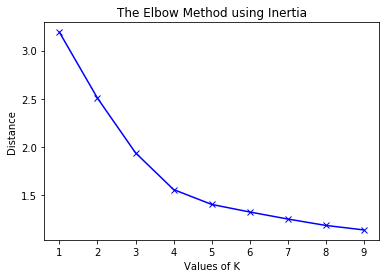

In [28]:
distances = [] 
K = range(1, 10)

chi_grouped_clustering = chi_food_grouped.drop('Community', 1)

# run k-means clustering
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(chi_grouped_clustering)
    distances.append(kmeans.inertia_ )

plt.plot(K, distances, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Distance') 
plt.title('The Elbow Method using Inertia') 
plt.show()

In [29]:
# we choose k = 4
# set number of clusters
kclusters = 4

chi_grouped_clustering = chi_food_grouped.drop('Community', 1)

# run k-means clustering
kmeans_chi = KMeans(n_clusters=kclusters, random_state=0).fit(chi_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans_chi.labels_[0:10] 

array([0, 1, 0, 3, 3, 3, 3, 0, 1, 3], dtype=int32)

In [30]:
# len(kmeans_chi.labels_)
len(community_foodspot_sorted['Community'])

77

In [31]:
# add clustering labels
community_foodspot_sorted.insert(0, 'Cluster Labels', kmeans_chi.labels_)

# assign the data frame for convenience
chi_merged = df_chi_info

# merge dataset to add latitude/longitude for each community
chi_merged = chi_merged.merge(community_foodspot_sorted, how='left', left_on='community', right_on='Community')                                              

chi_merged.head(5) # check the last columns!

,community,population,income,latitude,longitude,Cluster Labels,Community,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Rogers Park,54991,39482.0,42.010531,-87.670748,0,Rogers Park,Sandwich Place,Pizza Place,Bakery,Mexican Restaurant,Fast Food Restaurant,Indian Restaurant,Diner,Café,African Restaurant,Fried Chicken Joint
1,West Ridge,71942,47323.0,42.003548,-87.696243,0,West Ridge,Indian Restaurant,Sandwich Place,Mexican Restaurant,Pizza Place,Bakery,Pakistani Restaurant,Donut Shop,Burger Joint,American Restaurant,Korean Restaurant
2,Uptown,56362,40324.0,41.966630,-87.655546,0,Uptown,Vietnamese Restaurant,Pizza Place,Mexican Restaurant,Chinese Restaurant,Asian Restaurant,Sushi Restaurant,Thai Restaurant,Bakery,Hot Dog Joint,Italian Restaurant
3,Lincoln Square,39493,57749.0,41.975990,-87.689616,0,Lincoln Square,Thai Restaurant,Hot Dog Joint,Korean Restaurant,Breakfast Spot,Sandwich Place,Italian Restaurant,Bakery,Middle Eastern Restaurant,Pizza Place,New American Restaurant
4,North Center,31867,81524.0,41.956107,-87.679160,0,North Center,Pizza Place,Mexican Restaurant,Café,Thai Restaurant,Sandwich Place,American Restaurant,Sushi Restaurant,Italian Restaurant,Chinese Restaurant,Hot Dog Joint


### 2. Find proper labels for each cluster

In [32]:
chi_group_label = chi_merged.groupby(by=['Cluster Labels'])['1st Most Common Venue'].value_counts().to_frame().rename(columns={'1st Most Common Venue': 'count'}).reset_index()
chi_group_label

,Cluster Labels,1st Most Common Venue,count
0,0,Pizza Place,8
1,0,Mexican Restaurant,6
2,0,Sandwich Place,4
3,0,American Restaurant,3
4,0,Chinese Restaurant,3
5,0,Café,2
6,0,Italian Restaurant,2
7,0,Vietnamese Restaurant,2
8,0,Indian Restaurant,1
9,0,Thai Restaurant,1


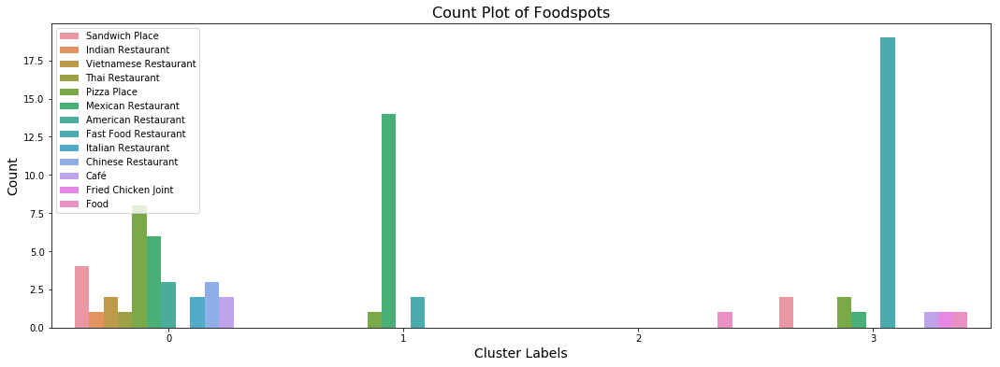

In [33]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(18, 6))
sns.countplot(x='Cluster Labels', hue='1st Most Common Venue', data=chi_merged, ax=ax)
ax.set_title('Count Plot of Foodspots', fontsize=16)
ax.set_xlabel('Cluster Labels', fontsize=14)
ax.set_ylabel('Count', fontsize=14)
plt.legend(loc='upper left')
plt.show()

### 3. Visualize the resulting clusters

In [50]:
# set color scheme for the clusters
x = np.arange(5)
ys = [i + x + (i*x)**2 for i in range(5)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
rainbow

['#8000ff', '#00b5eb', '#80ffb4', '#ffb360', '#ff0000']

In [53]:
# create map
map_clusters = folium.Map(location=[41.8781, -87.6298], zoom_start=10)

# set color scheme for the clusters
# x = np.arange(kclusters)
# ys = [i + x + (i*x)**2 for i in range(kclusters)]
# colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
# rainbow = [colors.rgb2hex(i) for i in colors_array]
rainbow = ['#8000ff', '#00b5eb', '#80ffb4', '#ff0000']

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(chi_merged['latitude'], chi_merged['longitude'], chi_merged['community'], chi_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [54]:
chi_merged.head()

,community,population,income,latitude,longitude,Cluster Labels,Community,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Rogers Park,54991,39482.0,42.010531,-87.670748,0,ROGERS PARK,Sandwich Place,Pizza Place,Bakery,Mexican Restaurant,Fast Food Restaurant,Indian Restaurant,Diner,Café,African Restaurant,Fried Chicken Joint
1,West Ridge,71942,47323.0,42.003548,-87.696243,0,WEST RIDGE,Indian Restaurant,Sandwich Place,Mexican Restaurant,Pizza Place,Bakery,Pakistani Restaurant,Donut Shop,Burger Joint,American Restaurant,Korean Restaurant
2,Uptown,56362,40324.0,41.966630,-87.655546,0,UPTOWN,Vietnamese Restaurant,Pizza Place,Mexican Restaurant,Chinese Restaurant,Asian Restaurant,Sushi Restaurant,Thai Restaurant,Bakery,Hot Dog Joint,Italian Restaurant
3,Lincoln Square,39493,57749.0,41.975990,-87.689616,0,LINCOLN SQUARE,Thai Restaurant,Hot Dog Joint,Korean Restaurant,Breakfast Spot,Sandwich Place,Italian Restaurant,Bakery,Middle Eastern Restaurant,Pizza Place,New American Restaurant
4,North Center,31867,81524.0,41.956107,-87.679160,0,NORTH CENTER,Pizza Place,Mexican Restaurant,Café,Thai Restaurant,Sandwich Place,American Restaurant,Sushi Restaurant,Italian Restaurant,Chinese Restaurant,Hot Dog Joint


In [55]:
# transfer to the upper case to fit the geojson file
chi_merged['Community'] = chi_merged['Community'].map(str.upper)

In [56]:
chi_geo = r'./data/chi_geo.json' # geojson file

# create a plain world map
chi_map = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

# generate choropleth map using the total immigration of each country to Canada from 1980 to 2013
chi_map.choropleth(
    geo_data=chi_geo,
    data=chi_merged,
    columns=['Community', 'population'],
    key_on='feature.properties.community',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Average Population'
)


# set color scheme for the clusters
# x = np.arange(kclusters)
# ys = [i + x + (i*x)**2 for i in range(kclusters)]
# colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
# rainbow = [colors.rgb2hex(i) for i in colors_array]
rainbow = ['#8000ff', '#00b5eb', '#80ffb4', '#ff0000']

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(chi_merged['latitude'], chi_merged['longitude'], chi_merged['community'], chi_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(chi_map)

# display map
chi_map

In [57]:
chi_geo = r'./data/chi_geo.json' # geojson file

# create a plain world map
chi_map_income = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

# generate choropleth map using the total immigration of each country to Canada from 1980 to 2013
chi_map_income.choropleth(
    geo_data=chi_geo,
    data=chi_merged,
    columns=['Community', 'income'],
    key_on='feature.properties.community',
    fill_color='YlGn', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Average Income'
)


# set color scheme for the clusters
# x = np.arange(kclusters)
# ys = [i + x + (i*x)**2 for i in range(kclusters)]
# colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
# rainbow = [colors.rgb2hex(i) for i in colors_array]
rainbow = ['#8000ff', '#00b5eb', '#80ffb4', '#ff0000']

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(chi_merged['latitude'], chi_merged['longitude'], chi_merged['community'], chi_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(chi_map_income)

# display map
chi_map_income